# 1) Introduction 

# Data

Our dataset consists of communication patterns between Twitter users. 

Input files  consist of ids of communicating people and the timestamps. This data consist of 55K files of 45GB. 

Below you can see an example of the input rows

[[631304263,1465275415],[1461984065,1466631701]]

Here the first tuple shows the ids, second shows the time stemps

# The Idea

The idea in this project is to group communications by time periods (i.e 3 months a period). Every period have its own network and an evolution analysis were attempted to be realized

# 2) Period Networks

There are 4 different networks to analyze for each quarter of the year. Firstly we analyze general statistics about these networks

In [3]:
import matplotlib.pyplot as plt
from collections import Counter
import pickle
import pandas as pd
import seaborn as sn
import string 

%matplotlib inline
%pylab inline
pylab.rcParams['figure.figsize'] = (15, 6)

def print_result(d):
    a = dict([(k, pd.Series([d[k]])) for k in d.keys()])
    pandas = pd.DataFrame(a)
    display(pandas)
    
    
def conf_matrix(array, title, xSize = 10, ySize = 7): 
    
    df_cm = pd.DataFrame(array, index = [i for i in string.ascii_uppercase[:len(array)]],
                      columns = [i for i in string.ascii_uppercase[:len(array)]])
    plt.figure(figsize = (xSize,ySize))
    sn.heatmap(df_cm, annot=True, fmt = '.2')
    plt.title(title)


Populating the interactive namespace from numpy and matplotlib


In [4]:
OUTPUT_DIRECTORY = '../outputFull_NofNetwork_4/'
years = [2016]
months = [[1,2,3],[4,5,6],[7,8,9],[10,11,12]]
NUMBER_OF_COMMUNITIES = 10 #How many community to analyze

Let's first see number of edges and number of users in each period.

In [3]:
for y in years:
    for m_index, m_list in enumerate(months):
        infoDict = pickle.load(open(OUTPUT_DIRECTORY+ str(y)+'_'+str(m_index)+'_info.pickle'))
        print 'Network Statistics For Year: ', y, ' Period: ', m_index
        print_result(infoDict)
        print '------------------------------------------------'

Network Statistics For Year:  2016  Period:  0


,nOfEdges,nOfNodes
0,301927024,65086756


------------------------------------------------
Network Statistics For Year:  2016  Period:  1


,nOfEdges,nOfNodes
0,298866600,64097001


------------------------------------------------
Network Statistics For Year:  2016  Period:  2


,nOfEdges,nOfNodes
0,295025019,63949173


------------------------------------------------
Network Statistics For Year:  2016  Period:  3


,nOfEdges,nOfNodes
0,218404789,54770156


------------------------------------------------


For each period there are around 300 million user. Only the last network is smaller. This is because last month's data is incomplete.

As seen this network is realy really big. Which makes it hard to analyze. 

# Matrix showing similarity between each months graph

After creating the networks, the first thing to do is to compare networks. For this Jaccard similarity matrix for the nodes of networks are shown below.

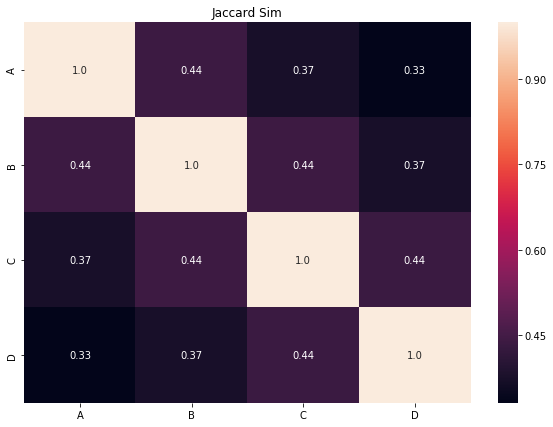

In [5]:
import cPickle as pickle
monthSimilarityMatrix = pickle.load(open(OUTPUT_DIRECTORY+ 'jaccardYearly.cPickle'))
conf_matrix(monthSimilarityMatrix,'Jaccard Sim')

As seen in the graph, the similariy measure is around 0.44 for consecutive months. This measure was expected to be higher however since the data was 10% of the whole, the similarity obtained is here.

# 3 ) Community Analysis

At first, a small sample of the network was analyzed by using NetworkX library for Python. However since the network is so big, it was not possible to use this library for the 300 million user network. Thus, we have switched to a more scalable community analysis tool by Ecole Normal Superior de Lyon.  Apart from Louvain algorithm which was implemented in this tool, all other tools were written manually (i.e statistics analysis)

Even with this tool, community detection takes around 16 hours for a computer from DTU HPC cluster.


For keeping track of different communities at different networks we have computed jaccard matrices between consecutive periods. As seen in the matrices below, with this technic it is possible to match most of the  communities to a community in the next period.

In [5]:
consecutiveMonthsJaccardDict50 = pickle.load(open(OUTPUT_DIRECTORY+ 'JACCARD_DICT_50.cPickle'))

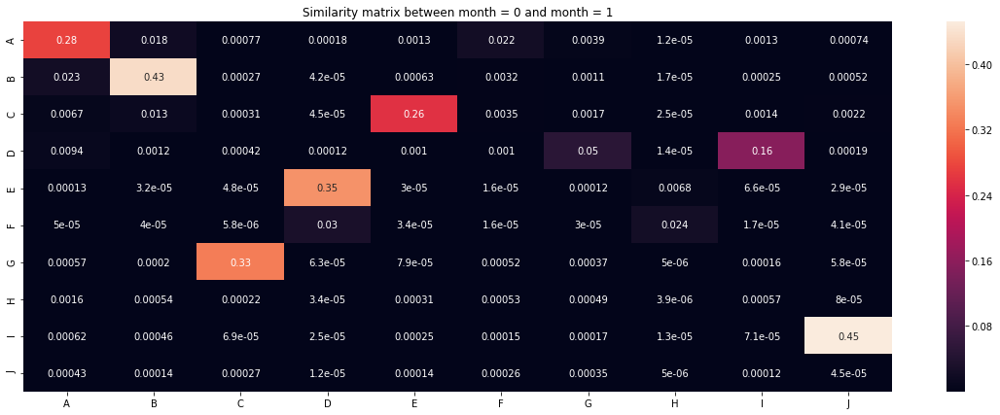

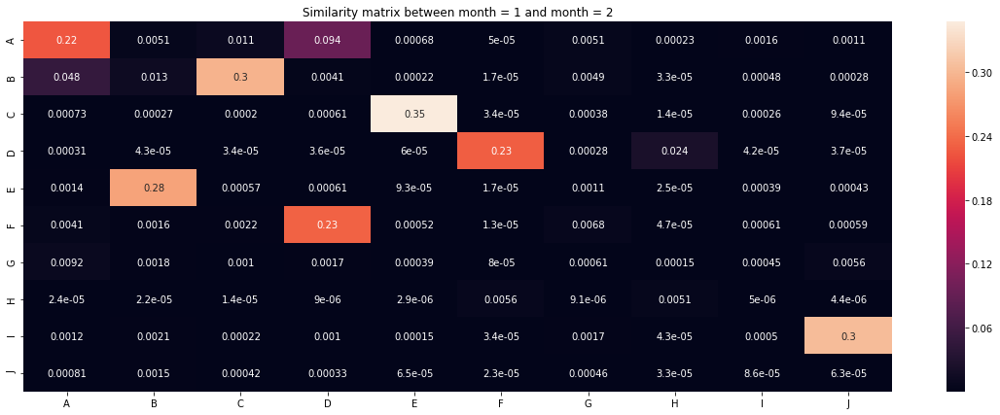

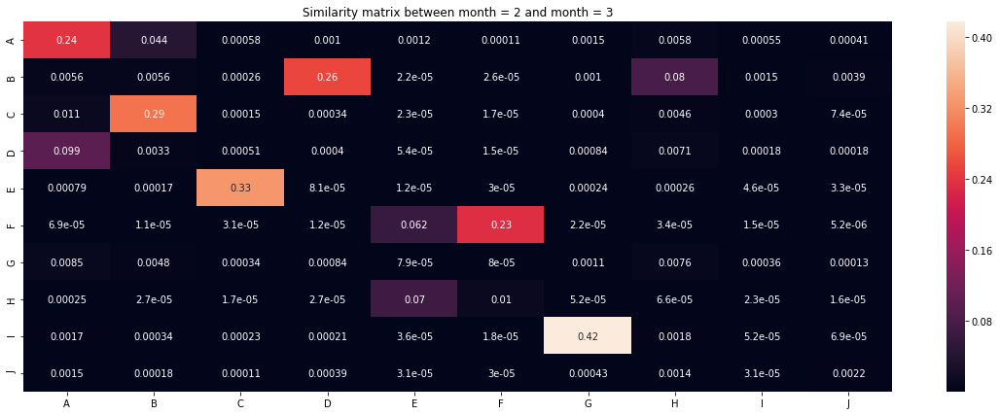

In [6]:
for i in consecutiveMonthsJaccardDict50:
    t = 'Similarity matrix between month = {} and month = {}'.format(i,i+1)
    conf_matrix(consecutiveMonthsJaccardDict50[i][:NUMBER_OF_COMMUNITIES,:NUMBER_OF_COMMUNITIES], t, 20,7)

# WORDCLOUD 

After obtaining the communities, the aim was to anayze those communities. For this, a sample of descriptions of the users in each community was collected and word clouds representing communities was obtained.

In [20]:
from wordcloud import WordCloud, STOPWORDS
from PIL import Image
import urllib, cStringIO
import cPickle as pickle
import arabic_reshaper
import matplotlib.pyplot as plt
from bidi.algorithm import get_display
import jieba
import textblob as txb



def getWordCloud(text, m, c, name):
    text = text[:500]
    b = txb.TextBlob(text)
    lang =  b.detect_language()
    print lang
     
        
        
    # # plot it.
    a = plt.figure()
    
    if(lang == 'ar'):
        try:
            text = arabic_reshaper.reshape(text)
            allWords = text.split()
            text = ""
            for mmm in allWords:
                try:
                    text += get_display(mmm) + " "
                except:
                    text += mmm + " "
#             text = get_display(text)
            word_cloud = WordCloud(font_path='arabtype.ttf',width=800, height=400,background_color="white", collocations=False,colormap='inferno',  normalize_plurals=False, stopwords = set(STOPWORDS)).generate(text)
    
        except:
            word_cloud = WordCloud(width=800, height=400,background_color="white", collocations=False,colormap='inferno',  normalize_plurals=False, stopwords = set(STOPWORDS)).generate(text)
              
    elif lang == 'ja':
#         word_cloud = WordCloud(font_path='SourceHanSerifK-Light.otf').generate(text)
        word_cloud = WordCloud(font_path='SourceHanSerifK-Light.otf',width=800, height=400,background_color="white", collocations=False,colormap='inferno',  normalize_plurals=False, stopwords = set(STOPWORDS)).generate(text)
    
        
    else: 
        word_cloud = WordCloud(width=800, height=400,background_color="white", collocations=False,colormap='inferno',  normalize_plurals=False, stopwords = set(STOPWORDS)).generate(text)
    
    
    plt.imshow(word_cloud, interpolation="bilinear")
    plt.title('M = ' + str(m) + '/' + str(c))
    plt.axis("off")
    plt.show()
    a.savefig("../wordCloudImages/" +name+".png")
    


In [21]:
y = 2016
m = 1 
descDict = pickle.load(open(OUTPUT_DIRECTORY + str(y) + '_' + str(m) + '_userDescriptions_2000.cPickle'))

In [22]:
len(descDict)

20

en


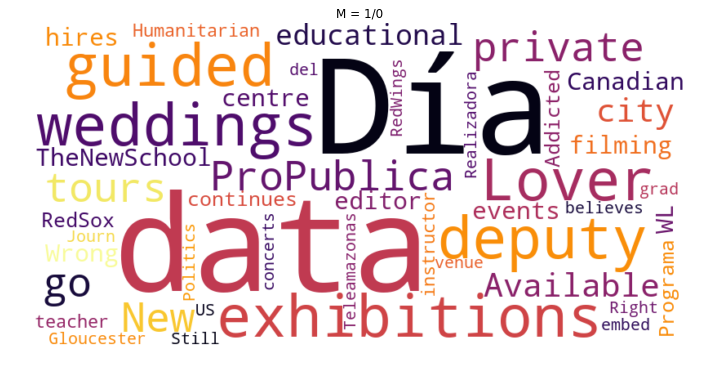

en


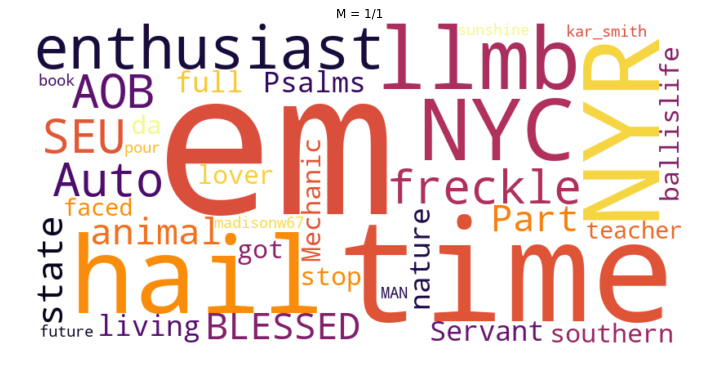

pt


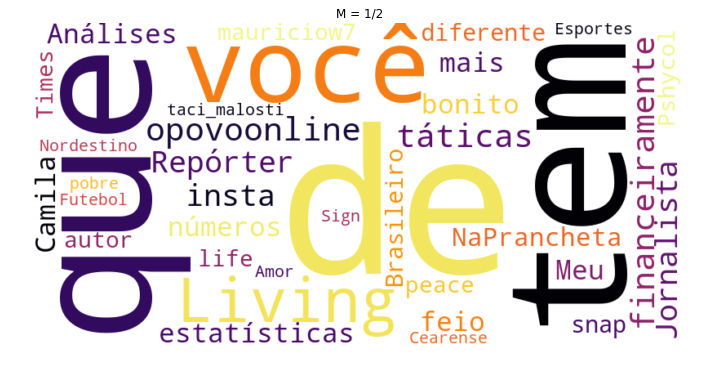

en


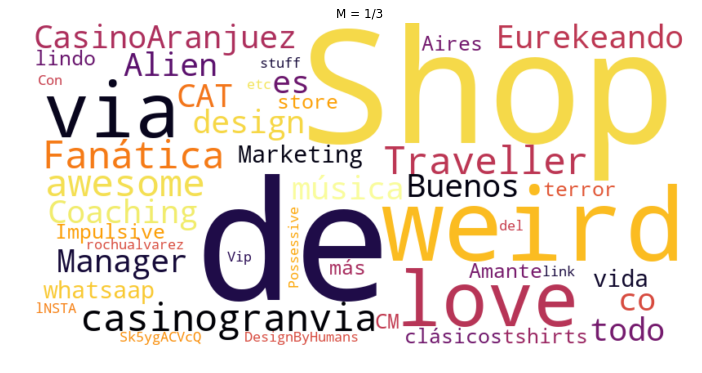

ja


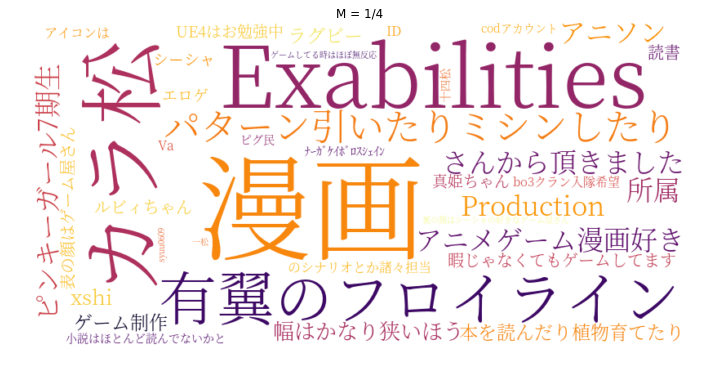

ja


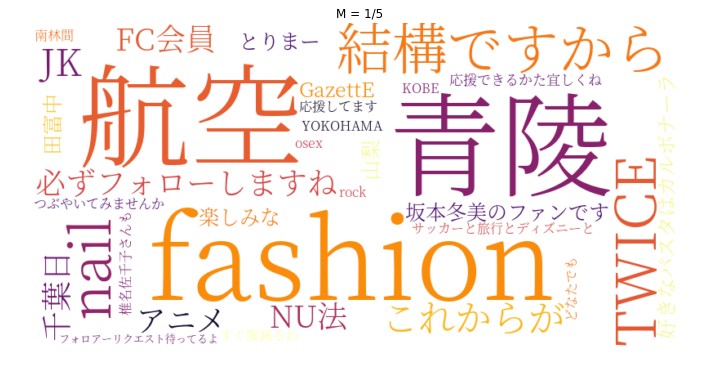

ar


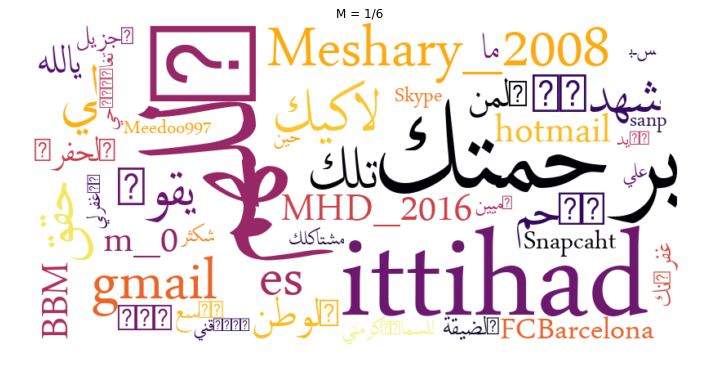

fr


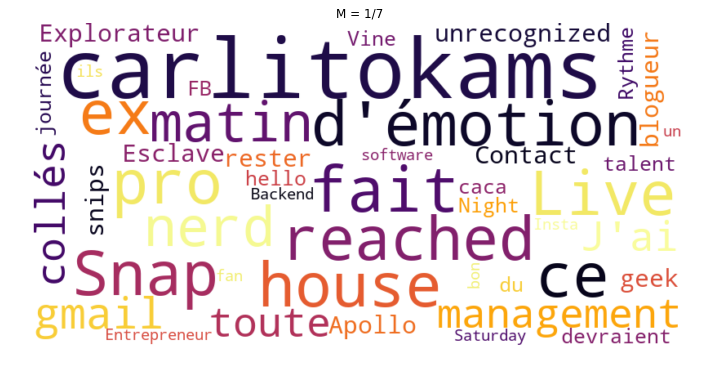

en


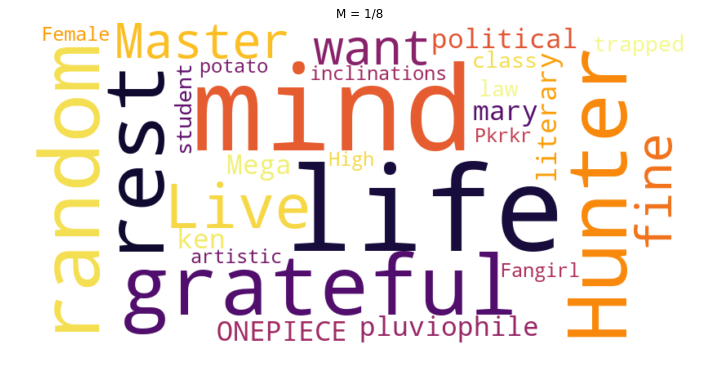

tr


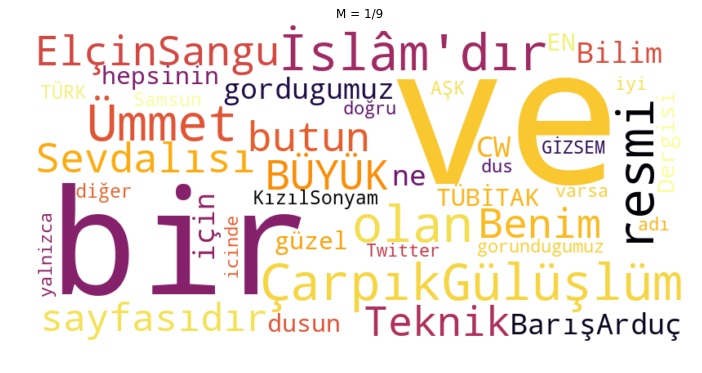

en


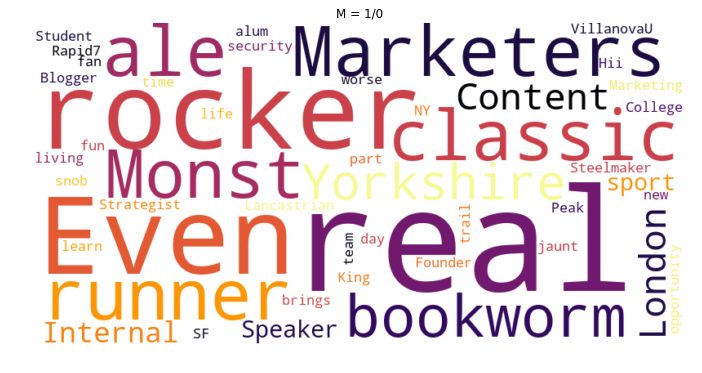

en


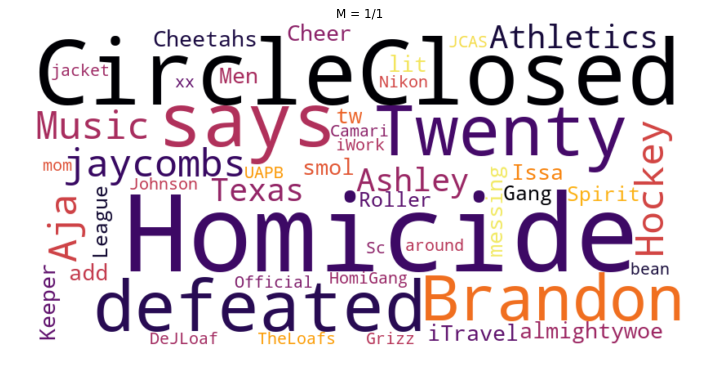

ar


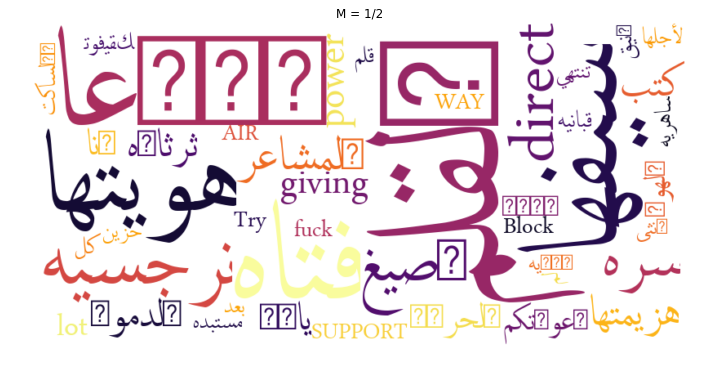

ja


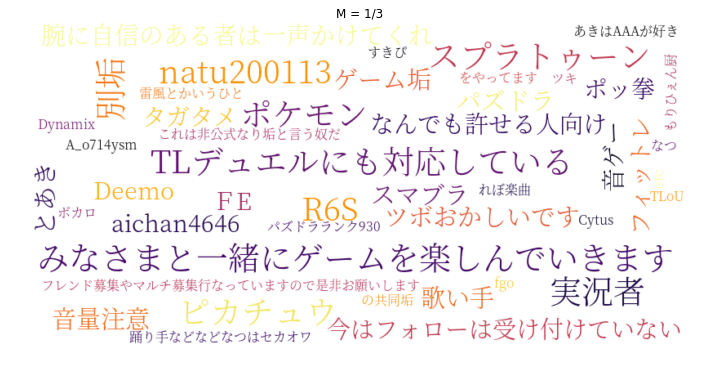

pt


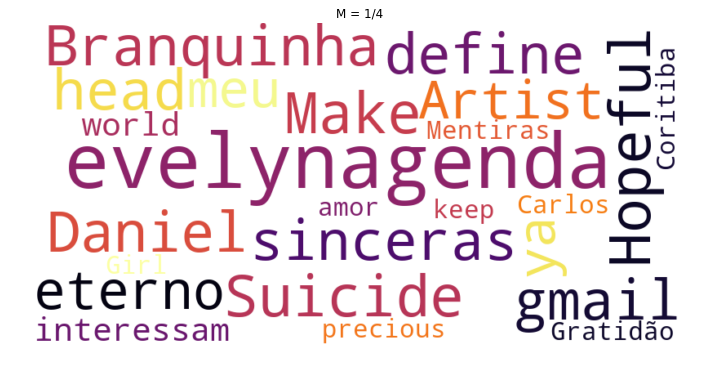

en


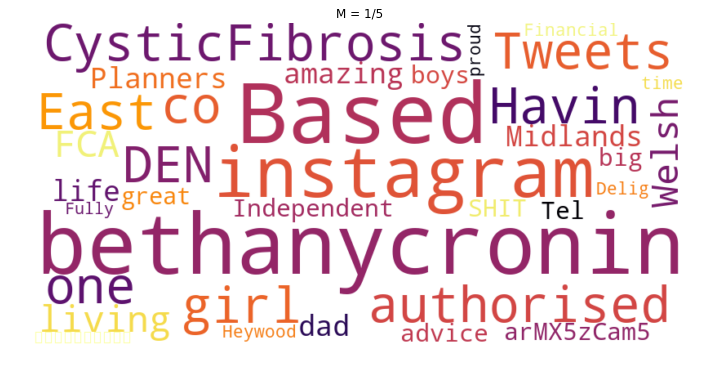

es


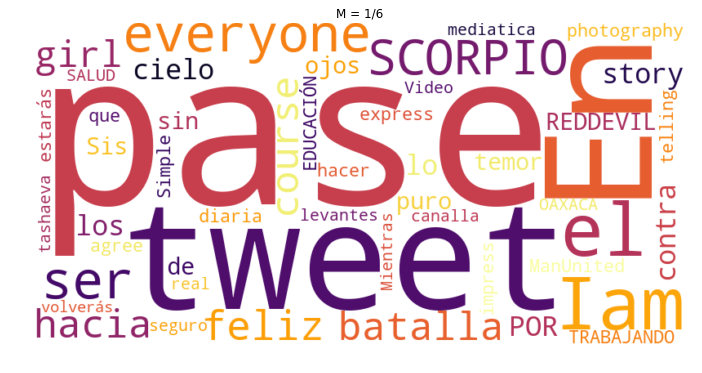

ja


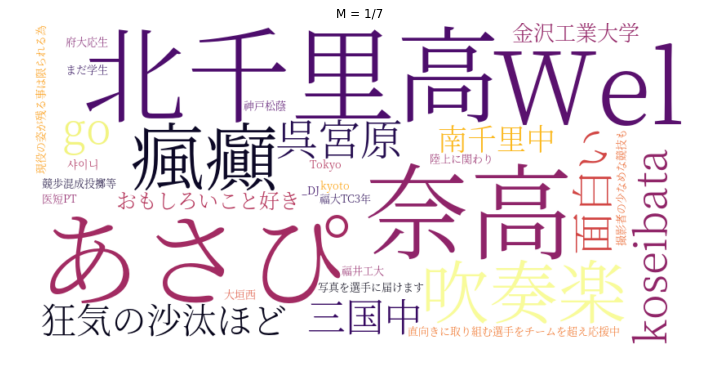

gl


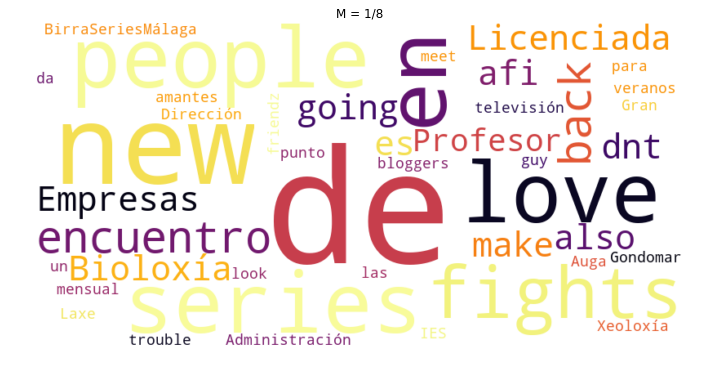

en


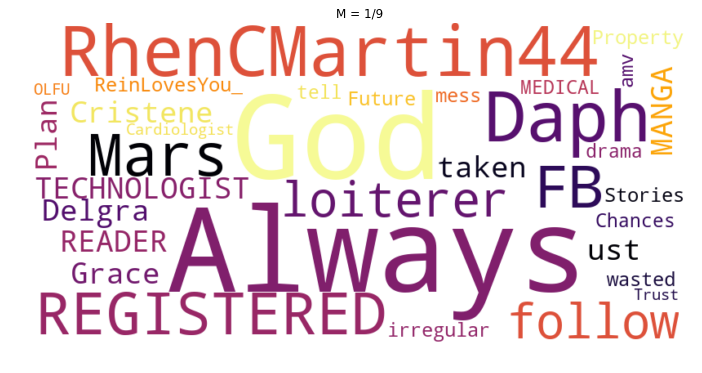

en


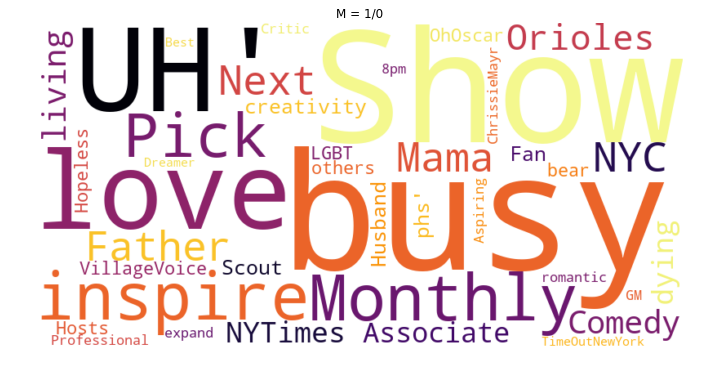

pt


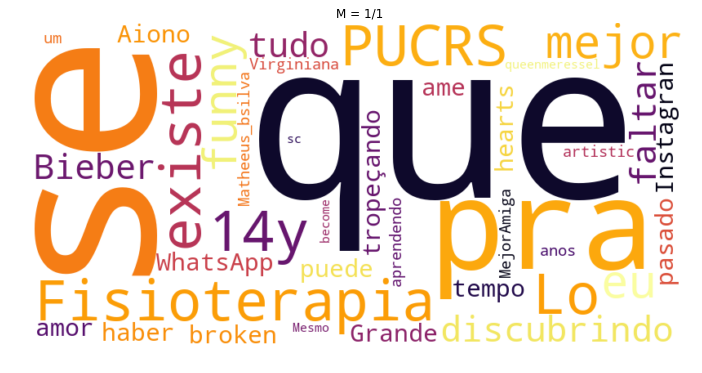

en


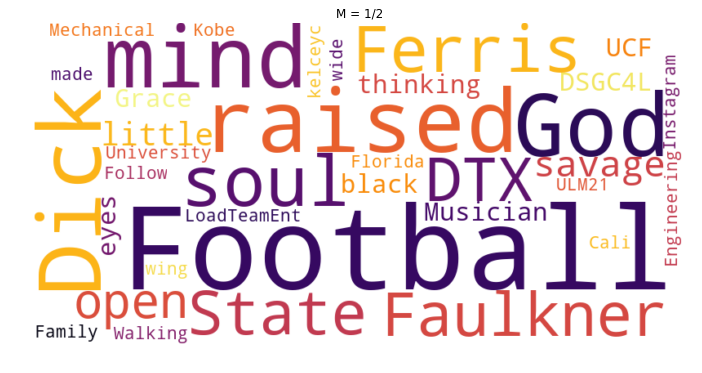

en


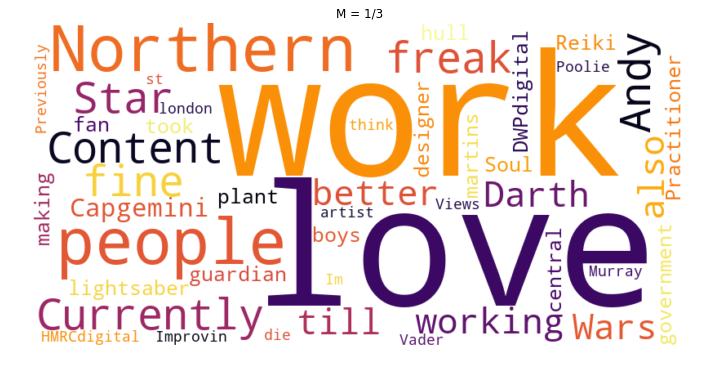

ar


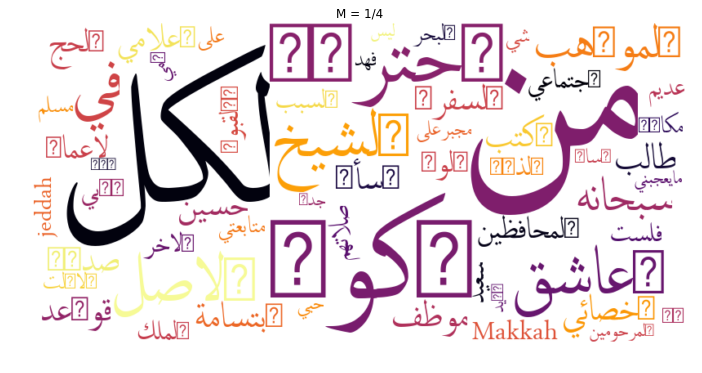

ja


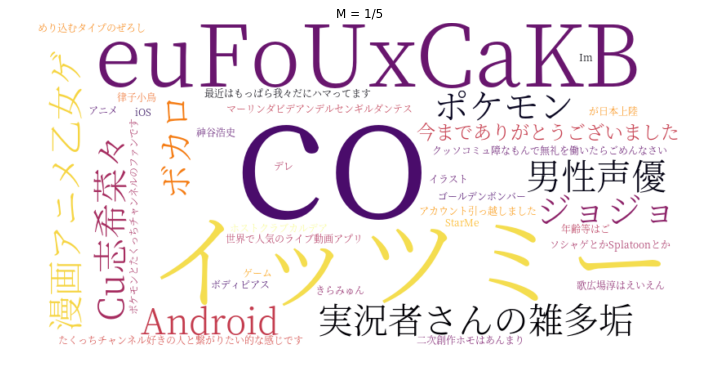

en


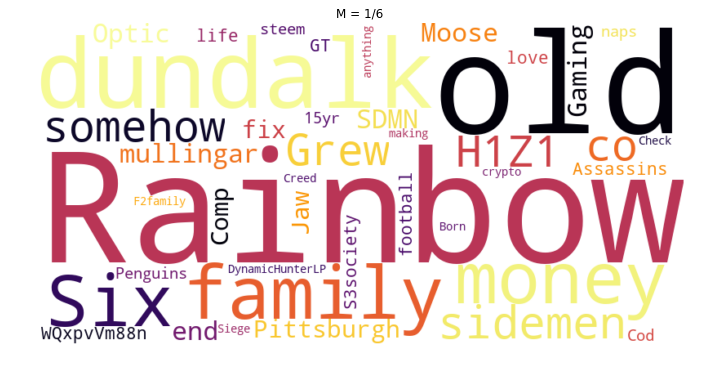

ja


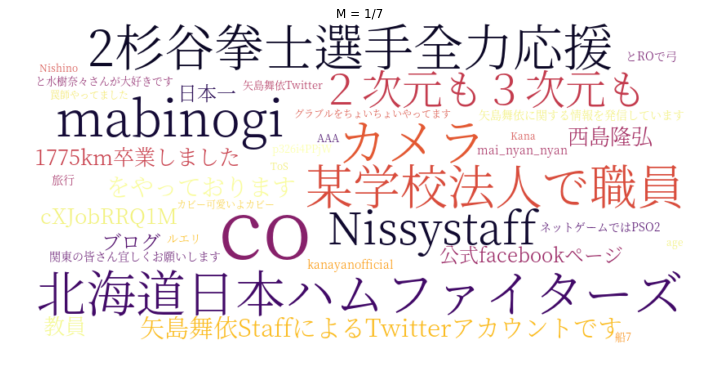

fr


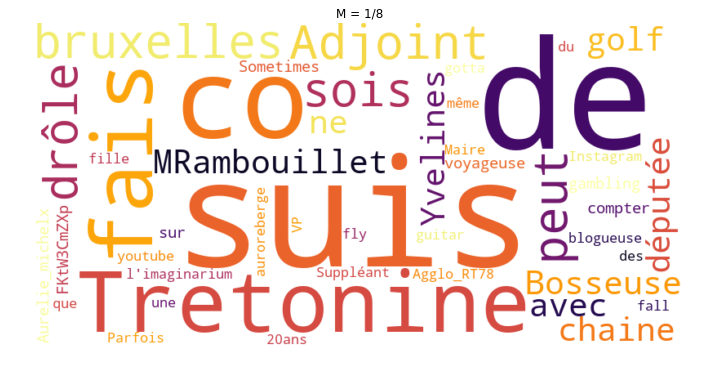

es


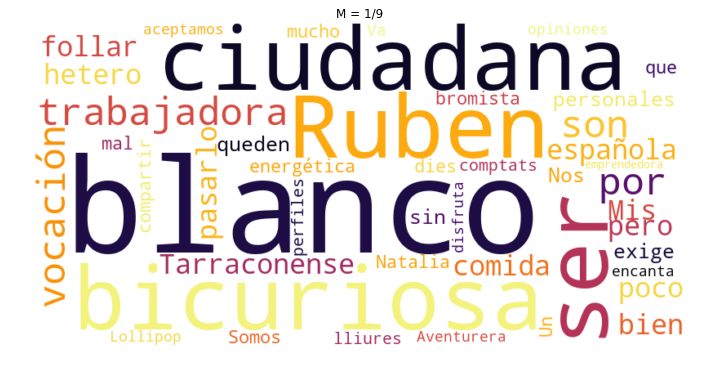

en


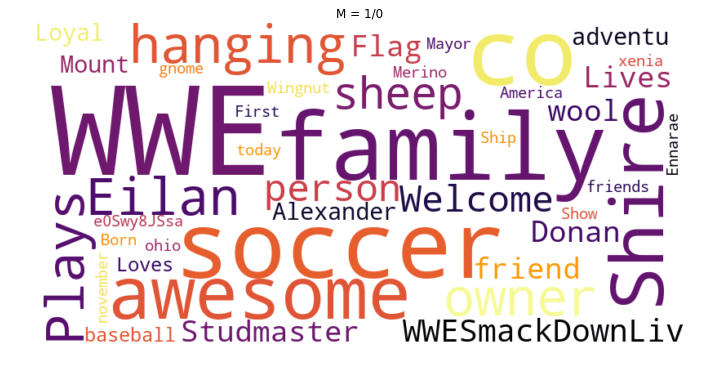

en


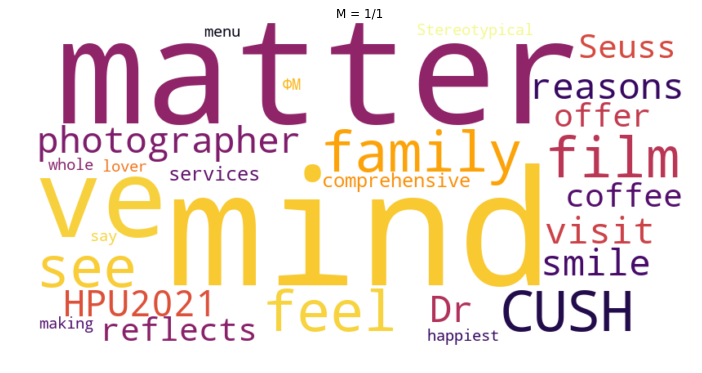

ar


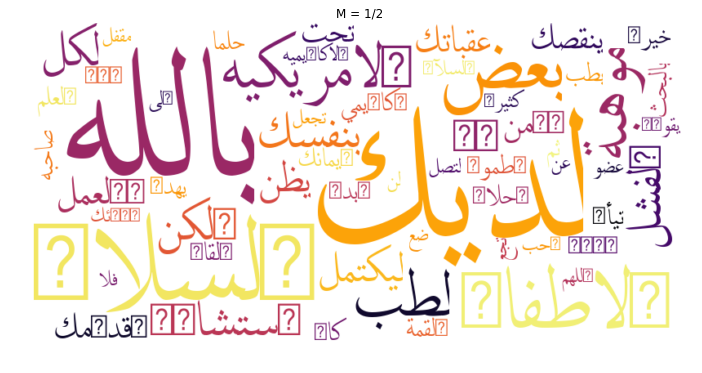

pt


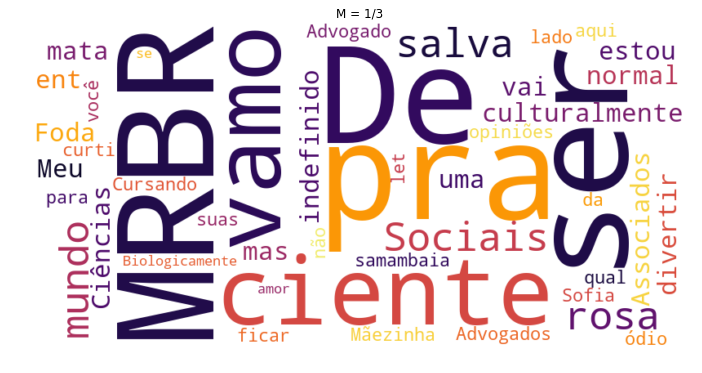

ja


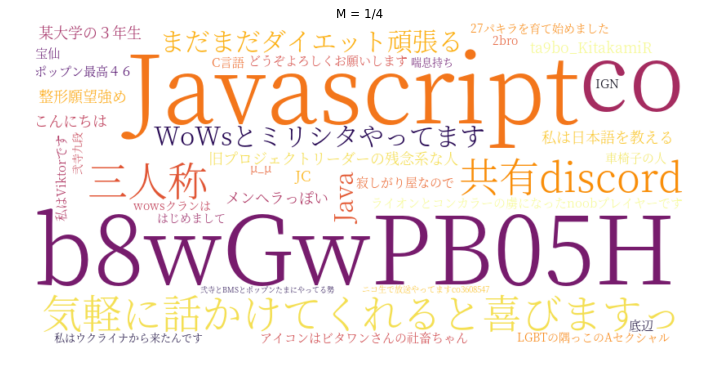

ja


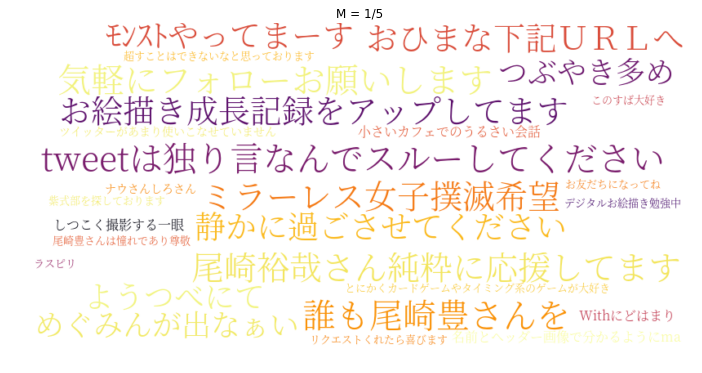

fr


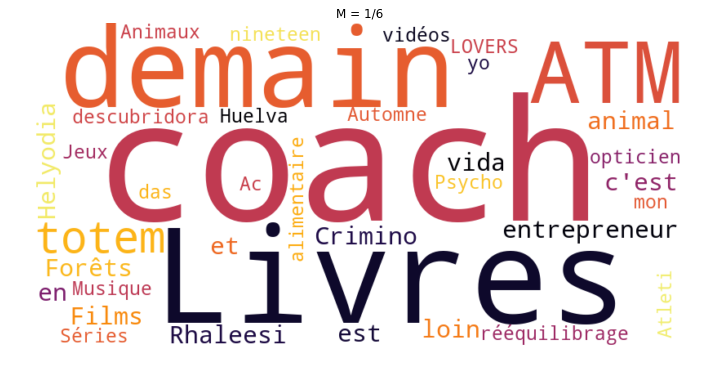

en


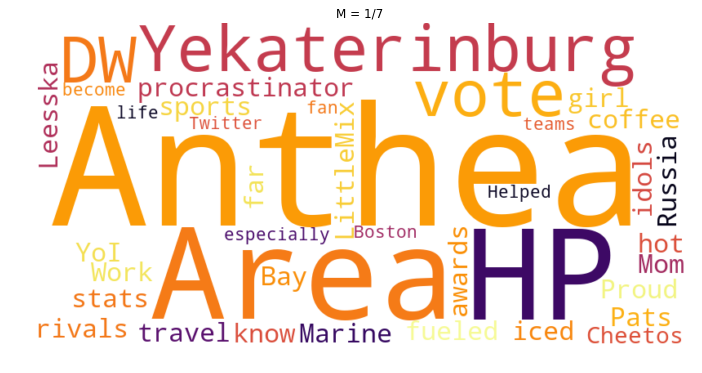

en


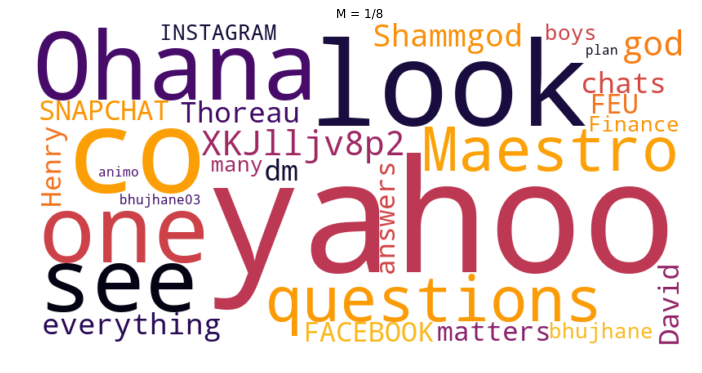

es


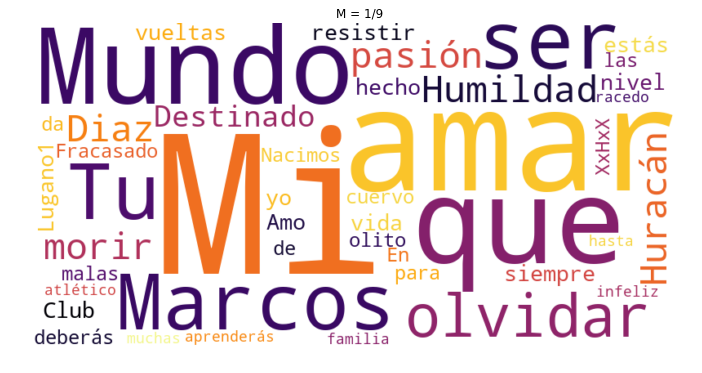

In [23]:
image_path = cStringIO.StringIO(urllib.urlopen('https://i.imgur.com/kftApxC.png').read())
texas_mask = np.array(Image.open(image_path))
# defining the wordcloud with stopwords and some edgy styling choices. 


STOPWORDS = STOPWORDS.union({'http','https','je','la','le','les'})
for m_index, m_list in enumerate(months):
    descDict = pickle.load(open(OUTPUT_DIRECTORY + str(y) + '_' + str(m_index) + '_userDescriptions_2000.cPickle'))
    for c in range(NUMBER_OF_COMMUNITIES):
        text = descDict[c]
        getWordCloud(text,m,c, 'm_'+ str(m) + 'c_'+str(c) )

As seen in the word clouds, there are many repetitions between the word clouds, for obtaining a better representatioin a TF-IDF analysis was processed on the descriptions of each community

en


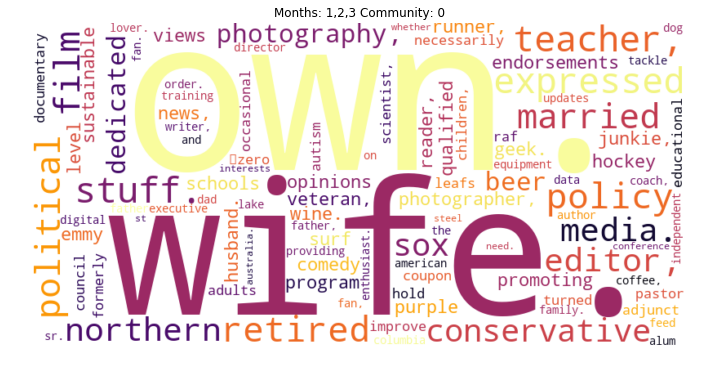

en


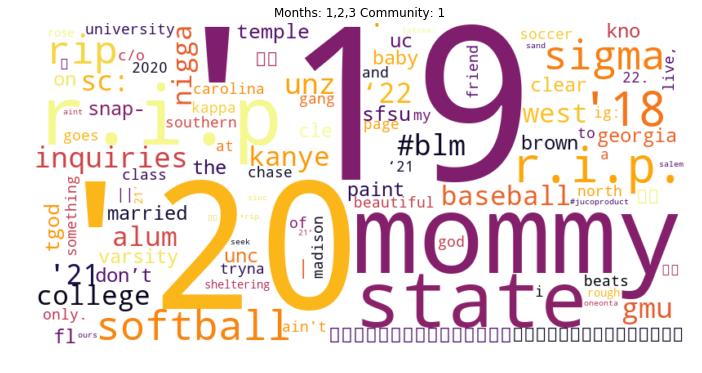

pt


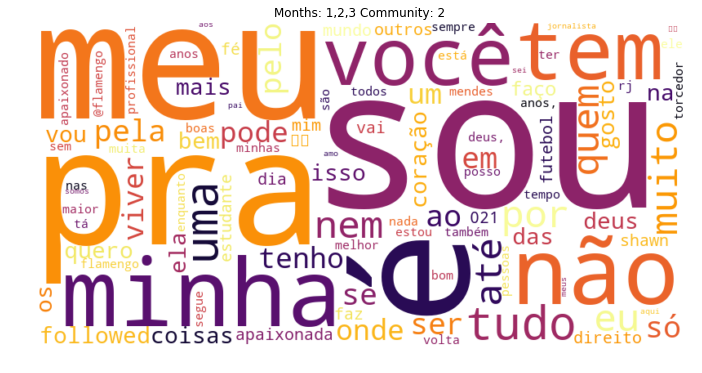

es


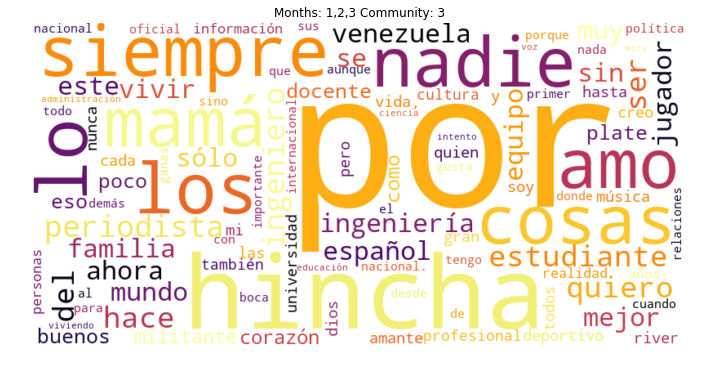

ja


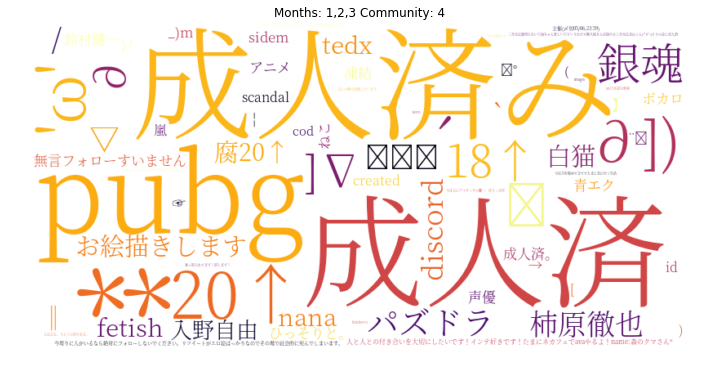

ja


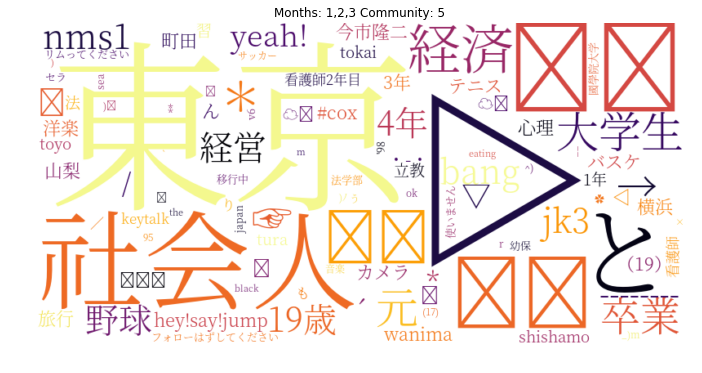

ar


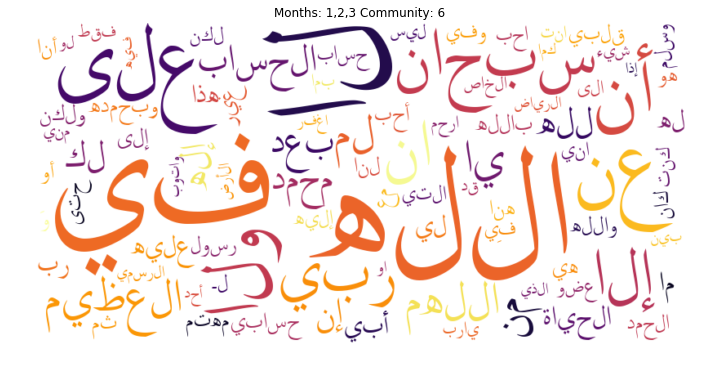

fr


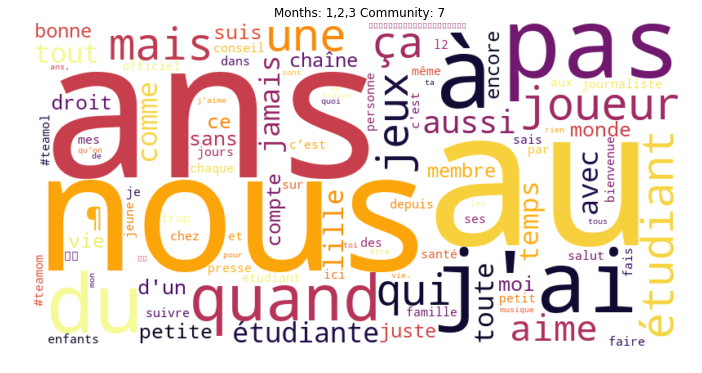

tl


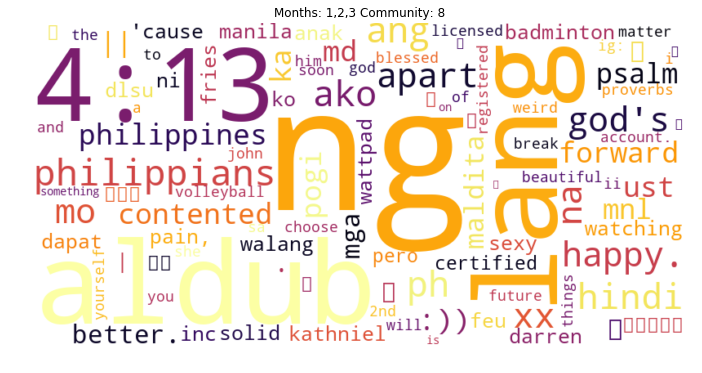

tr


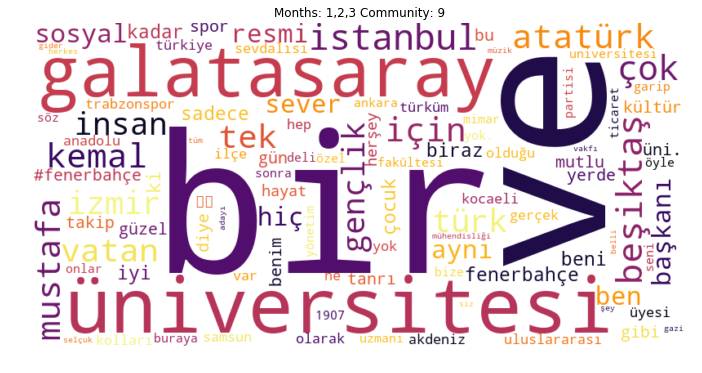

en


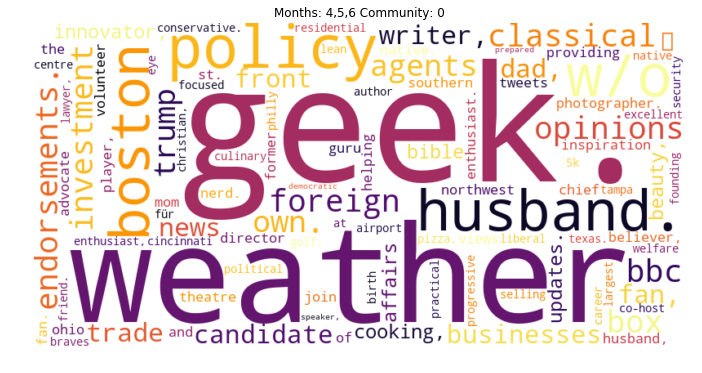

en


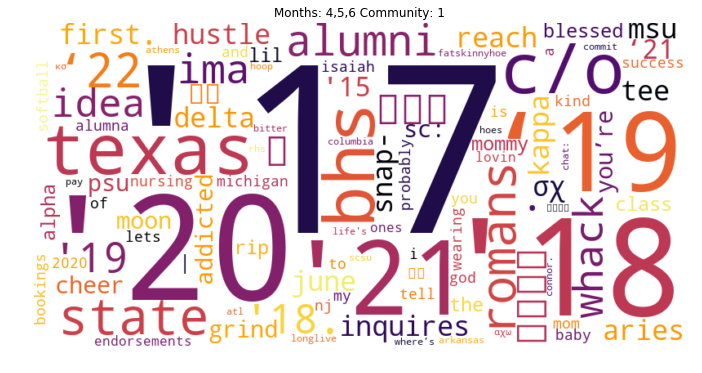

ar


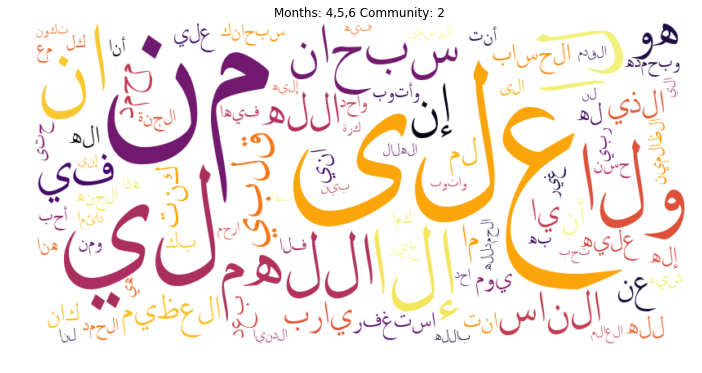

ja


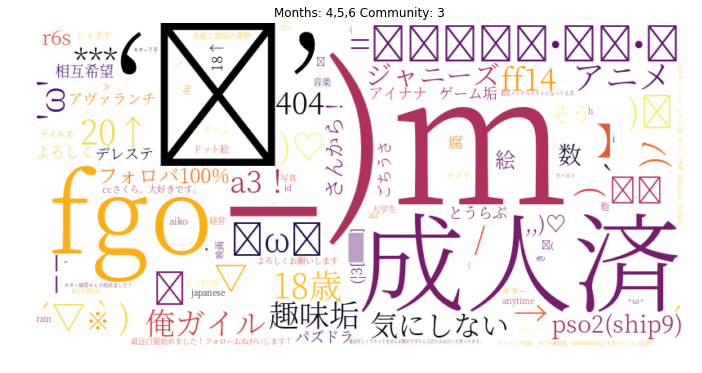

pt


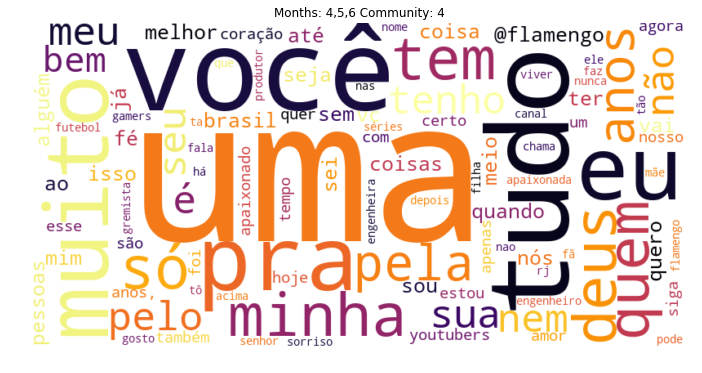

en


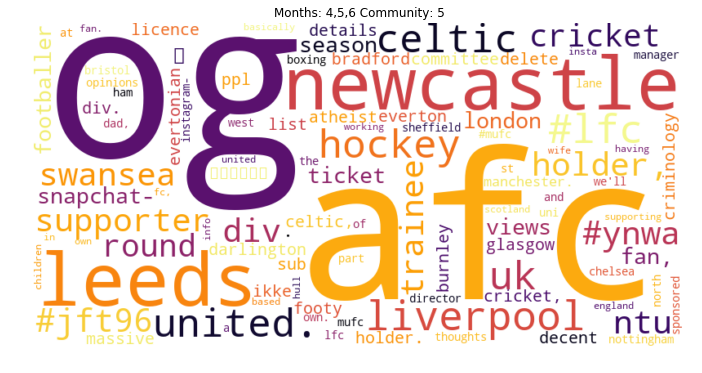

es


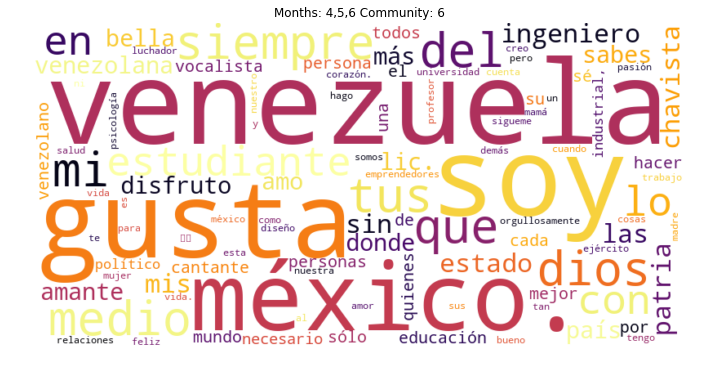

ja


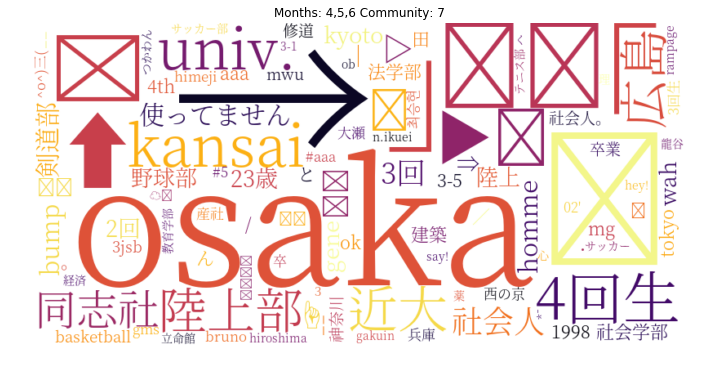

es


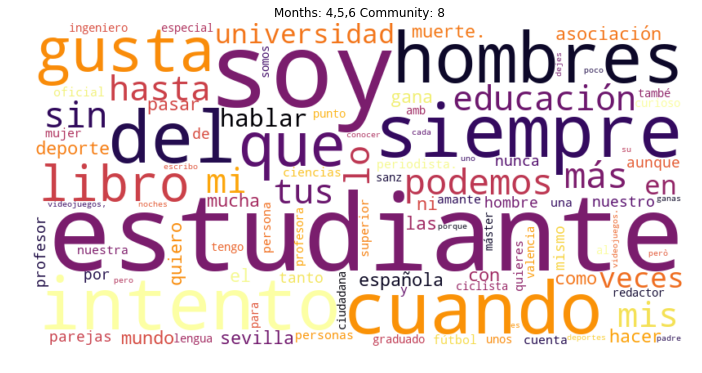

en


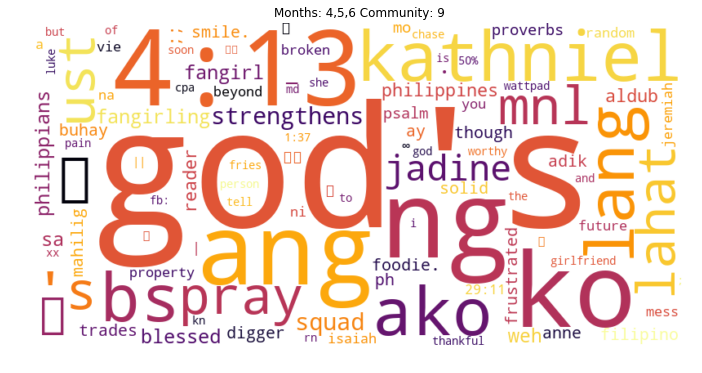

en


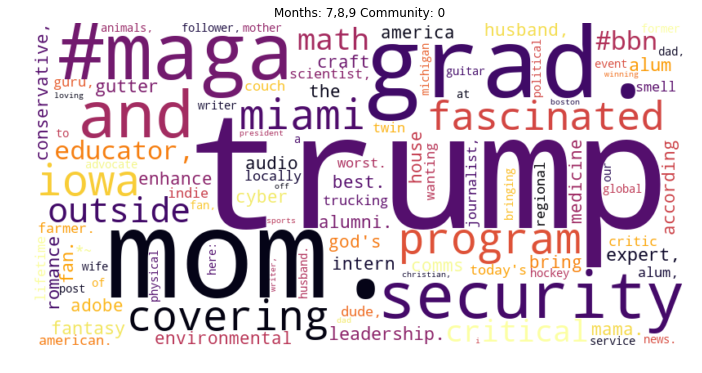

pt


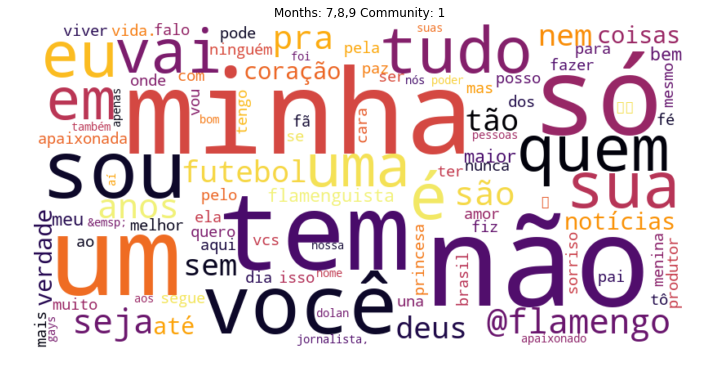

en


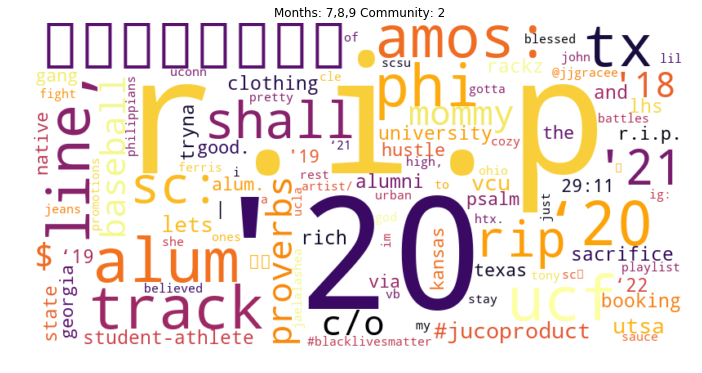

en


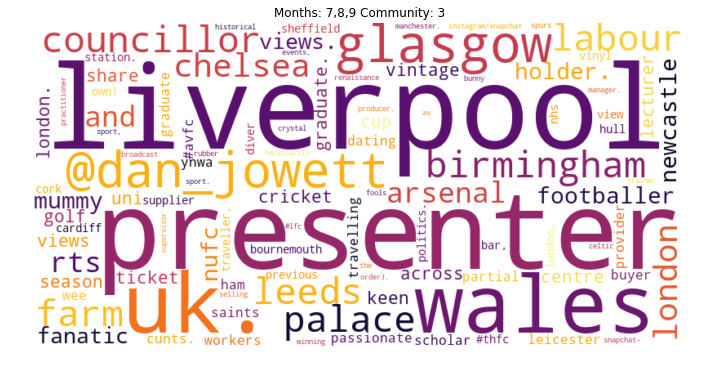

ar


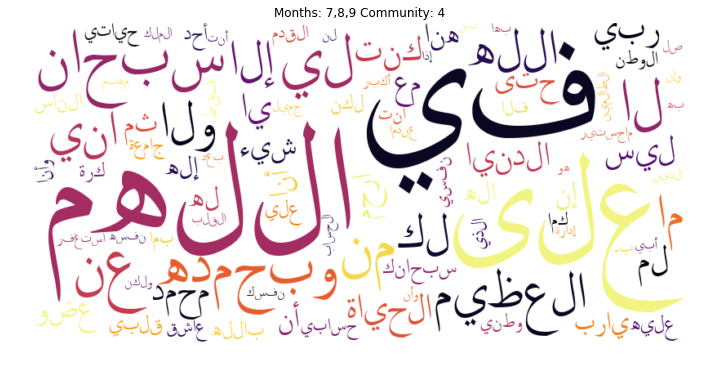

ja


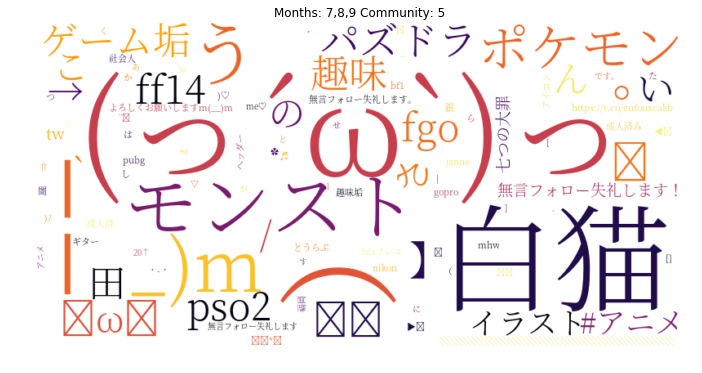

en


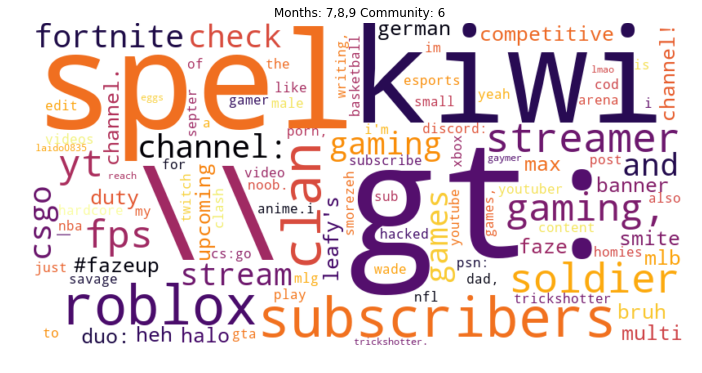

ja


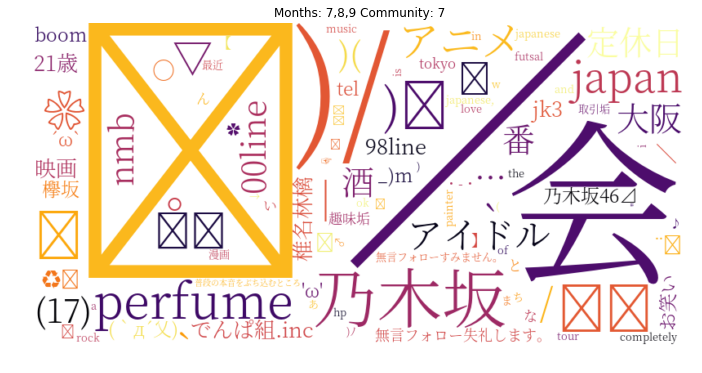

fr


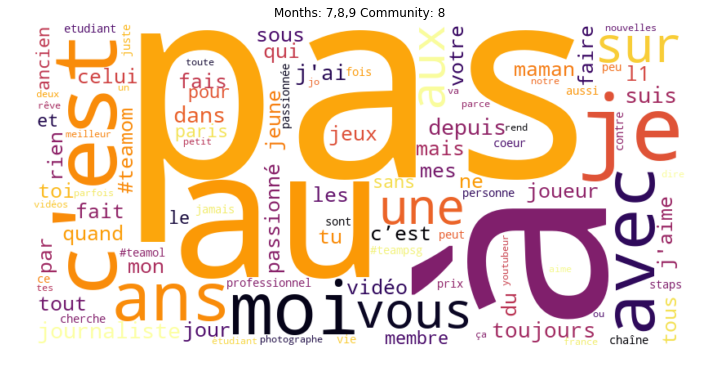

es


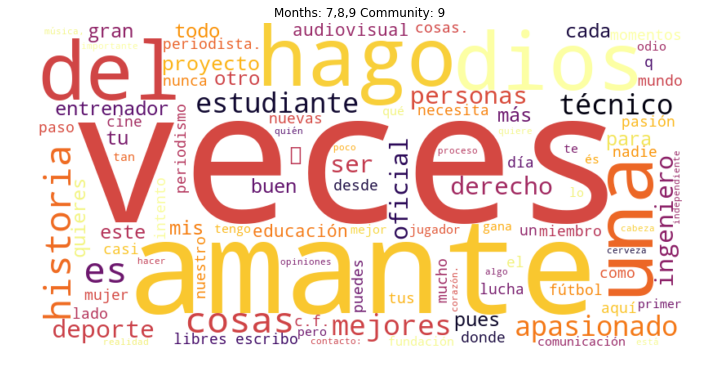

en


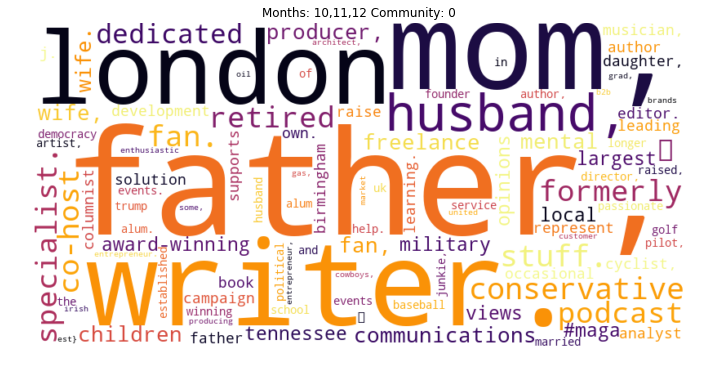

en


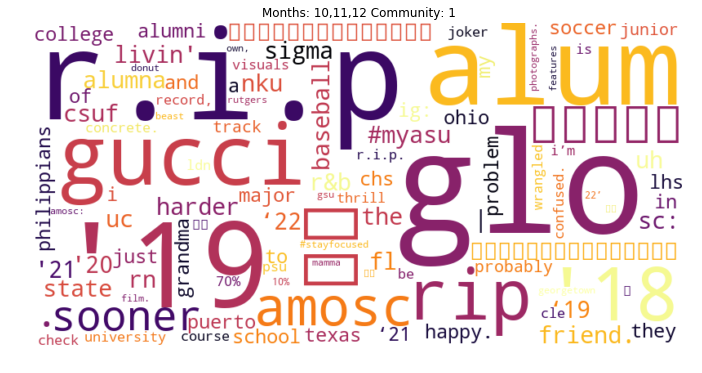

ar


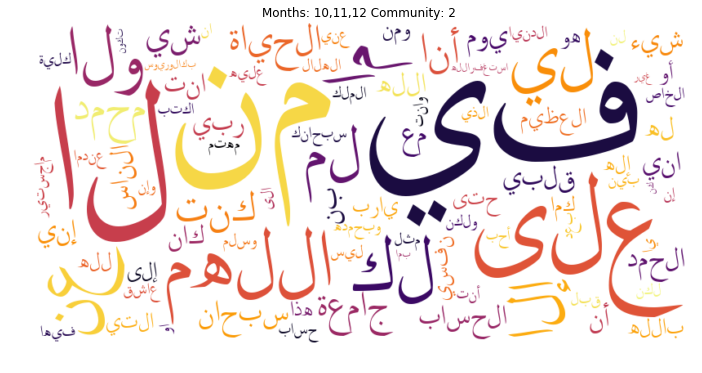

pt


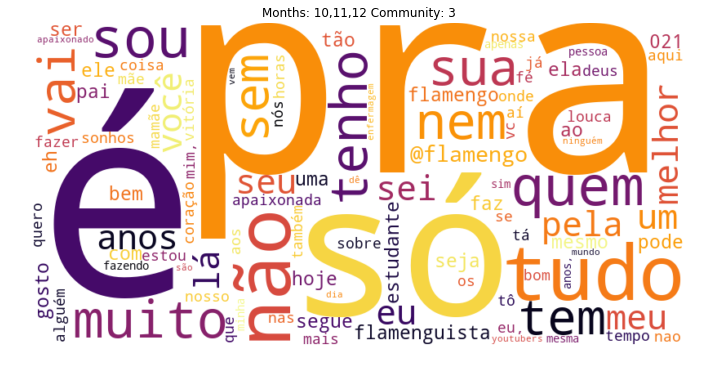

ja


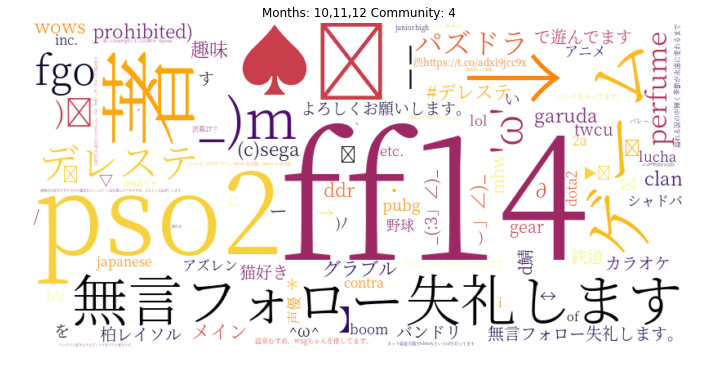

ja


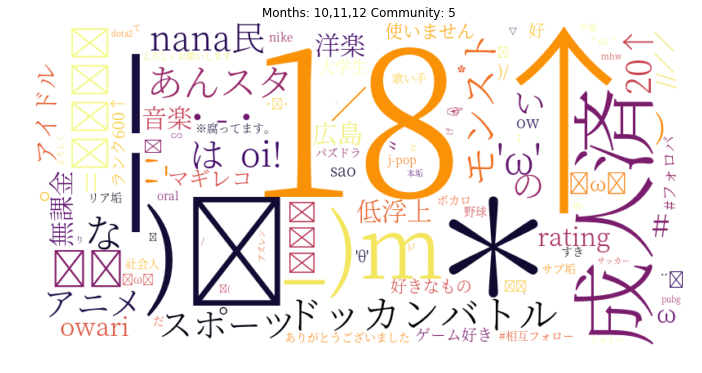

fr


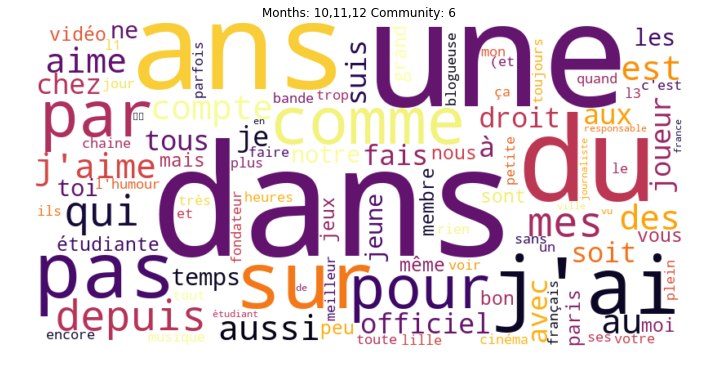

en


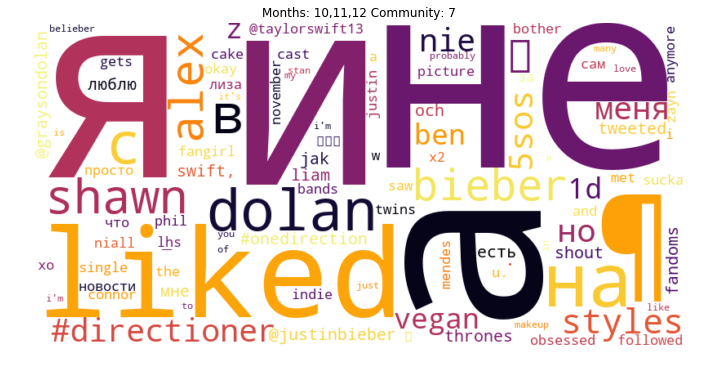

en


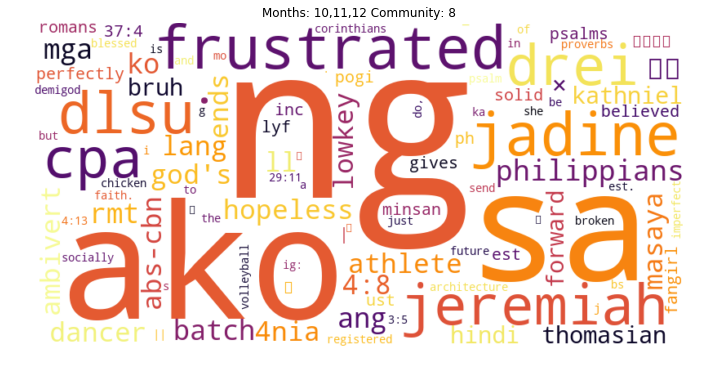

es


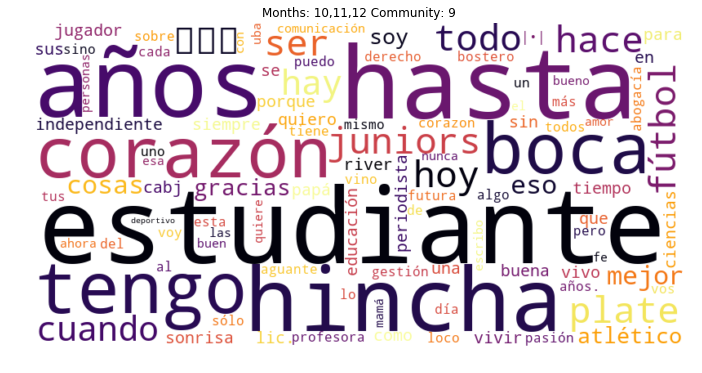

In [30]:
from __future__ import division
import string
import math
from sklearn.feature_extraction.text import TfidfVectorizer
image_path = cStringIO.StringIO(urllib.urlopen('https://i.imgur.com/kftApxC.png').read())
texas_mask = np.array(Image.open(image_path))
# defining the wordcloud with stopwords and some edgy styling choices. 

def tokenize(text):
    d = text.split('\n--------------\n')
    out = []
    for i in d:
        out+=i.split()
    return out


STOPWORDS = STOPWORDS.union({'http','https','je','la','le','les'})
for m_index, m_list in enumerate(months):
    descDict = pickle.load(open(OUTPUT_DIRECTORY + str(y) + '_' + str(m_index) + '_userDescriptions_2000.cPickle'))
#     tokenize = lambda doc: doc.lower().split(" ")
    sklearn_tfidf = TfidfVectorizer(norm='l2',min_df=0, use_idf=True, smooth_idf=False, sublinear_tf=True, tokenizer=tokenize)
#     print descDict.values()
    a = sklearn_tfidf.fit(descDict.values())
    b = sklearn_tfidf.fit_transform([descDict[c] for c in range(NUMBER_OF_COMMUNITIES)])
    indexToWord = {v: k for k, v in a.vocabulary_.iteritems()}
#     print indexToWord
    for c in range(NUMBER_OF_COMMUNITIES):
        tfIdFVec = np.squeeze(b[c].toarray())
        k = tfIdFVec.argsort()[::-1][:100]
        t = dict()
        
        for f in k:
            t[indexToWord[f]] = tfIdFVec[f]
        if '' in t:
            del t['']
        
        deneme = ' '.join(t.keys()[:100])
        ohMy = txb.TextBlob(deneme)
        lang =  ohMy.detect_language() 
        print lang
        if lang == 'ar':
            for i in t.keys():
                try:
                    t[get_display(i)] = t[i]
                except:
                    print 'lol'
                del t[i]
            word_cloud = WordCloud(font_path='arabtype.ttf',width=800, height=400,background_color="white", collocations=False,colormap='inferno', normalize_plurals=False)
        elif lang == 'ja' or lang == 'ch' or lang == 'zh-CN':
            word_cloud = WordCloud(font_path='SourceHanSerifK-Light.otf',width=800, height=400,background_color="white", collocations=False,colormap='inferno',  normalize_plurals=False, stopwords = set(STOPWORDS)).generate(text)
    
            
            
        else:
             word_cloud = WordCloud(width=800, height=400,background_color="white", collocations=False,colormap='inferno', normalize_plurals=False)
        
        
        plt.figure()
        word_cloud.generate_from_frequencies(t)
        plt.imshow(word_cloud, interpolation="bilinear")
        plt.title('Months: ' +  ','.join(str(m) for m in m_list) + ' Community: ' + str(c) )
        plt.axis("off")
        plt.show()

The word clouds obtained are pretty diverse and gives idea about each community. For example it is easily seen that communities generally are divided by language. There are many community from the english language which seems to be from different countries.

# Community Networks

Another interesting analysis was the relation between communities. For this a smaller network was created. Here each node represents a community and the edges represent the relation between each community. Edge weights are set to represent the degree of the relation (Number of communicaitions between each community). Since there is basically an edge between all communities a backbone algorithm was run on the network to extract only the most important relations.  

Below you can see the network for the 1st period

<img src="images/community2.png">

Here the sizes of each node implies the number of users in each community. It is possible to see all the networks at and the wordclouds related to each network at the link below.

https://ahmetbaglan.github.io/CommunitiesNetworkD3/


# 4) Conclusions 

In this project we have tried to understand the Twitter network. We have extracted communities on the network and tried to understand the community using the desccriptions people have used. Moreover we have created community network to see the relations between biggest communities.